In [152]:
import seaborn as sn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from matplotlib.font_manager import fontManager
import networkx as nx

#STEP 1: 讀檔
df = pd.read_csv('cooccurance_matrix.csv', encoding = 'big5hkscs', index_col = 0)
np.fill_diagonal(df.values, 0) #設對角線為零
df.head()

,# 投資,風險,本基金,基金,股票,國內,公司股票,上市,證券,產業,...,成立,經濟建設,外銷,營收,金鑽獎,market,中型,BBB,位於,介於
keyword,,,,,,,,,,,,,,,,,,,,,
# 投資,0,42827,32902,20655,7715,1135,394,1343,4113,4589,...,175,105,105,105,35,30,72,135,30,30
風險,42827,0,20230,12774,5129,626,201,872,3223,2952,...,65,39,39,39,13,28,68,126,28,28
本基金,32902,20230,0,11131,3771,590,212,682,1446,2356,...,90,54,54,54,18,0,36,0,0,0
基金,20655,12774,11131,0,2485,554,158,460,1173,1591,...,90,54,54,54,18,0,28,0,0,0
股票,7715,5129,3771,2485,0,234,119,383,584,923,...,35,21,21,21,7,0,12,0,0,0


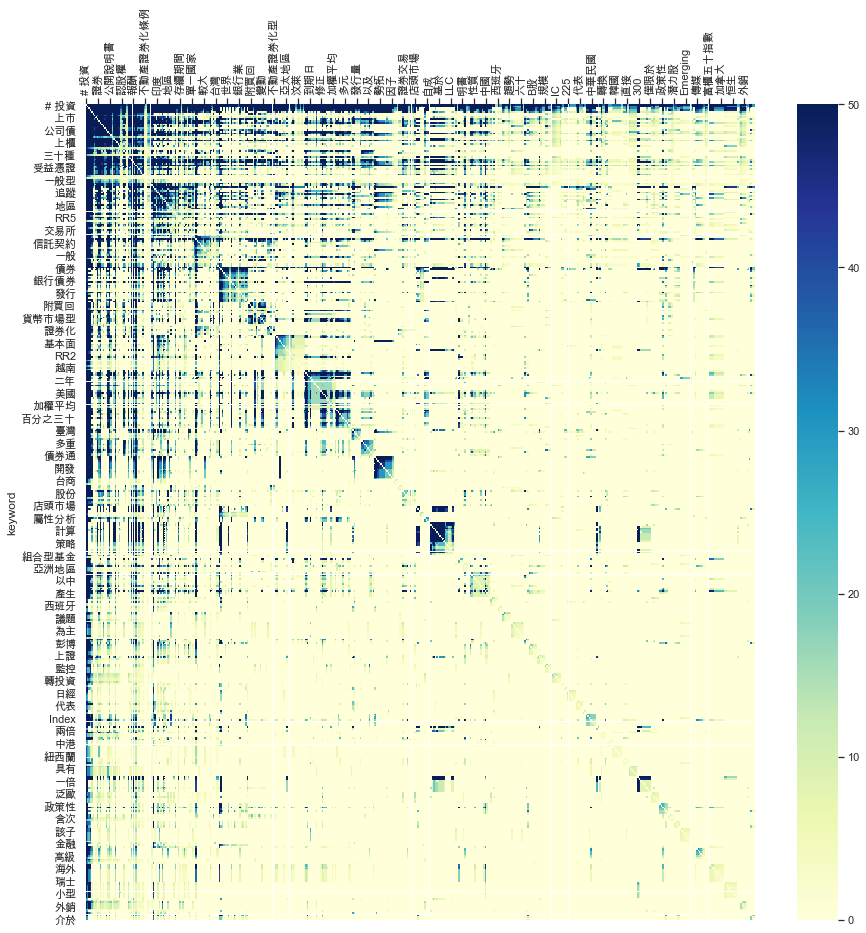

In [140]:
#STEP 2: 畫熱點圖（Heat Map）
plt.figure(figsize = (15, 15))
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']
plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = True
plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = False
#把Scaling設定到能看出差別（暫時）
sn.heatmap(df, cmap = 'YlGnBu', vmin = 0, vmax = 50, linewidths = 0.0001, linecolor= 'white') 
plt.show()

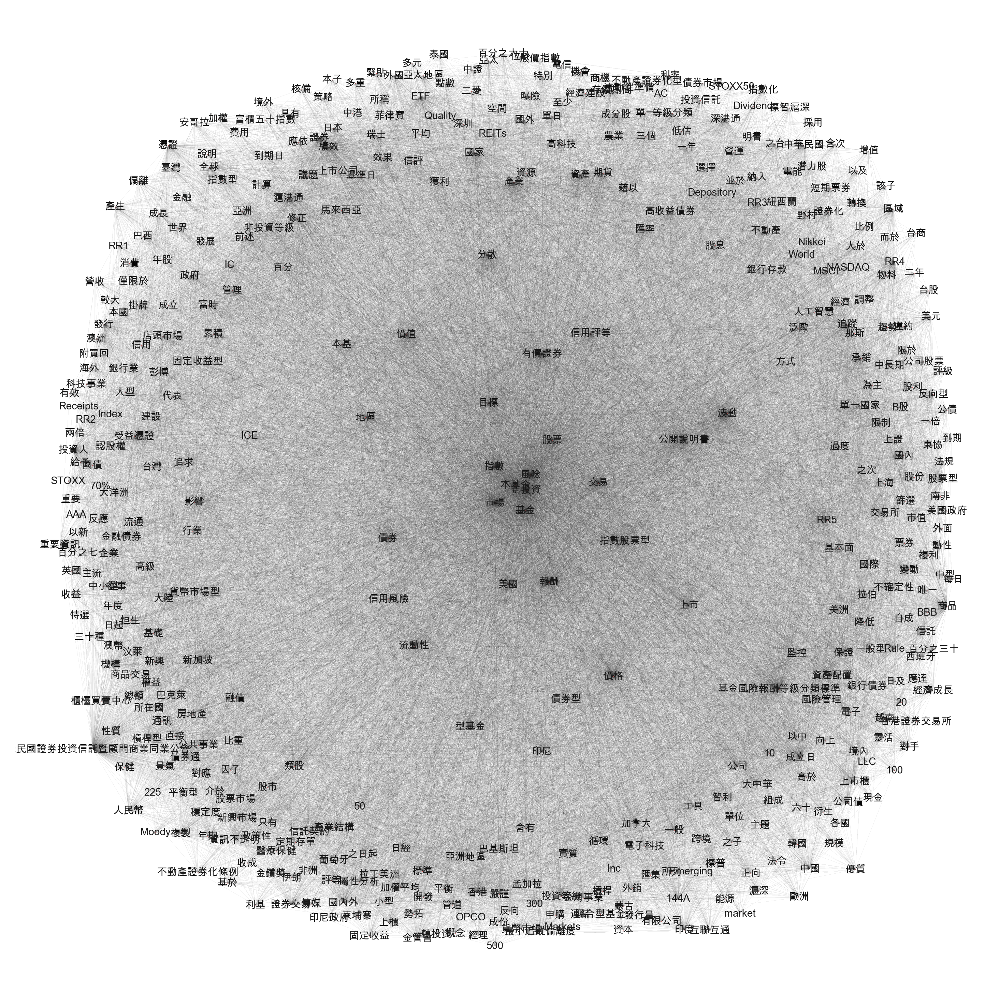

In [227]:
#STEP 3: 畫共現圖（Network map）

graph = nx.from_numpy_matrix(df.values)
graph = nx.relabel_nodes(graph, dict(enumerate(df.columns)))

plt.figure(figsize = (40, 40))
pos = nx.spring_layout(G, k = 0.9, iterations = 20)
nx.draw(graph, pos, with_labels = True, font_size = 30, node_size = 1, width = 0.06)